In [ ]:
import os
import glob as glob
import matplotlib.pyplot as plt
import cv2
import requests

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import yaml

config = {
    "train": "/content/drive/MyDrive/garbage/data/train",
    "val": "/content/drive/MyDrive/garbage/data/val",
    "nc": 6,  # Number of classes
    "names": ["plastic", "cloth", "electrical", "kitchen", "medical", "paper"]  # Class names
}

custom_path = "/content/drive/MyDrive/garbage/data.yaml"  # Specify your desired custom path

with open("cu.yaml", "w") as file:
    yaml.dump(config, file)

In [ ]:

if not os.path.exists('yolov5'):
    !git clone https://github.com/ultralytics/yolov5.git
%cd yolov5/
!pip install -r requirements.txt

Cloning into 'yolov5'...
remote: Enumerating objects: 16041, done.
remote: Counting objects: 100% (74/74), done.
remote: Compressing objects: 100% (49/49), done.
remote: Total 16041 (delta 42), reused 44 (delta 25), pack-reused 15967
Receiving objects: 100% (16041/16041), 14.61 MiB | 28.88 MiB/s, done.
Resolving deltas: 100% (11008/11008), done.
/content/yolov5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.6/190.6 kB 5.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 644.8/644.8 kB 12.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 9.8 MB/s eta 0:00:00


In [ ]:
e=16
!python train.py --data ../cust.yaml --weights yolov5m.pt \
    --img 640 --epochs {e} --batch-size 16

2023-11-03 07:24:54.303146: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-11-03 07:24:54.303203: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-11-03 07:24:54.303238: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5m.pt, cfg=, data=../cust.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=16, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project

In [ ]:
%cd /content/yolov5/
!python train.py --img 416 --batch 16 --epochs 10 --data '../cust.yaml' -  --weights 'yolov5s.pt' --name yolov5s_results  --cache

/content/yolov5
2023-11-03 07:38:37.204952: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-11-03 07:38:37.205014: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-11-03 07:38:37.205060: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
usage: train.py [-h] [--weights WEIGHTS] [--cfg CFG] [--data DATA] [--hyp HYP] [--epochs EPOCHS]
                [--batch-size BATCH_SIZE] [--imgsz IMGSZ] [--rect] [--resume [RESUME]] [--nosave]
                [--noval] [--noautoanchor] [--noplots] [--evolve [EVOLVE]] [--bucket BUCKET]
                [--cache [CACHE]] [--image-weights] [--dev

In [ ]:
%cd /content/yolov5/
!python train.py --img 416 --batch 16 --epochs 10 --data '/content/drive/MyDrive/garbage/data.yaml' --weights 'yolov5s.pt' --name yolov5s_results --cache


/content/yolov5
2023-11-03 07:41:18.055359: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-11-03 07:41:18.055416: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-11-03 07:41:18.055452: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=, data=/content/drive/MyDrive/garbage/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=10, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optim

In [ ]:
# Import Libraries
import numpy as np
import pandas as pd
import os
import torch
from IPython.display import Image
import shutil
from random import choice
import yaml
import matplotlib.pyplot as plt
import random
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score
from google.colab import files
from ultralytics import YOLO
from IPython.display import HTML
from base64 import b64encode
from utils.plots import plot_results

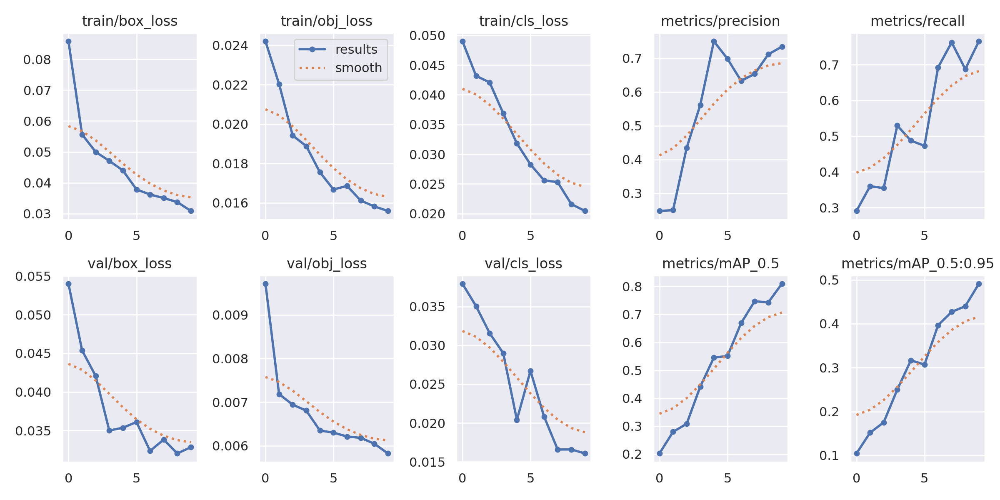

In [ ]:

# we can also output some older school graphs if the tensor board isn't working for whatever reason...
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/yolov5/runs/train/yolov5s_results/results.png', width=1000)  # view results.png

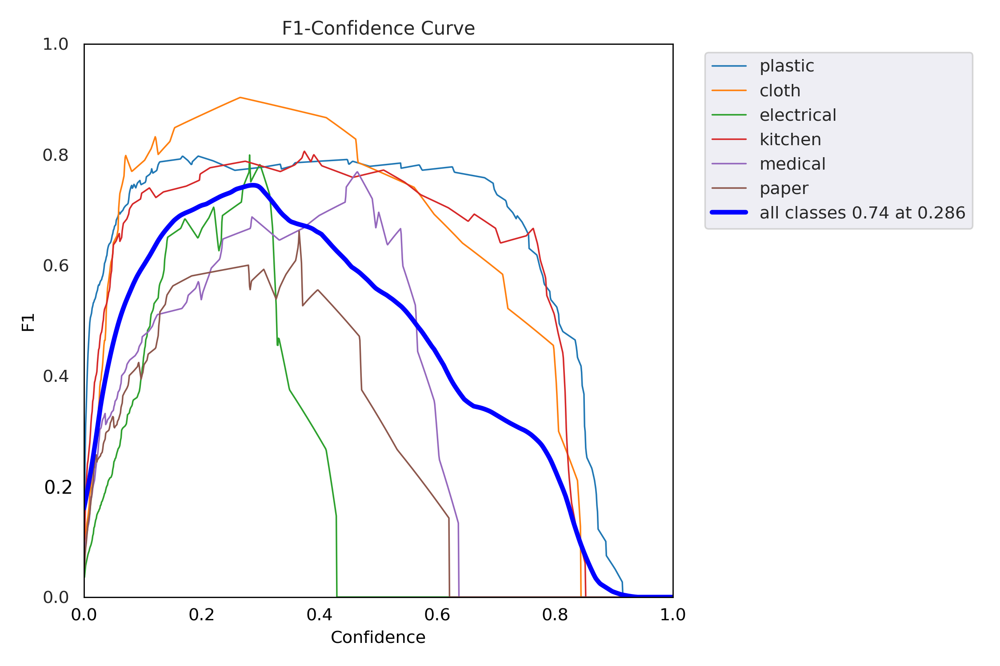

In [ ]:
Image(filename='/content/yolov5/runs/train/yolov5s_results/F1_curve.png', width=900)

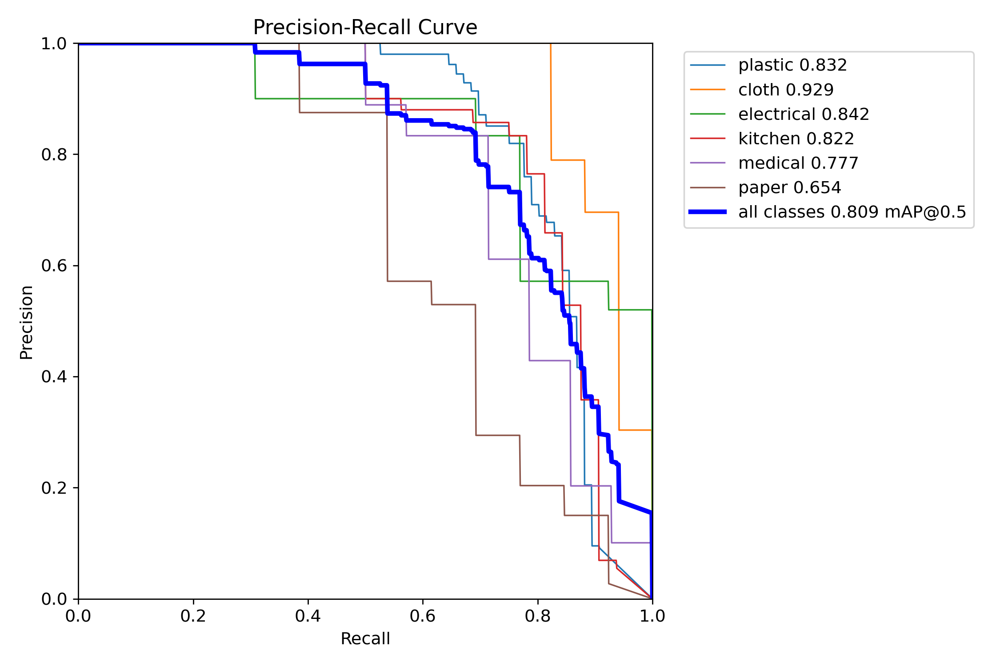

In [ ]:
Image(filename='/content/yolov5/runs/train/yolov5s_results/PR_curve.png', width=900)

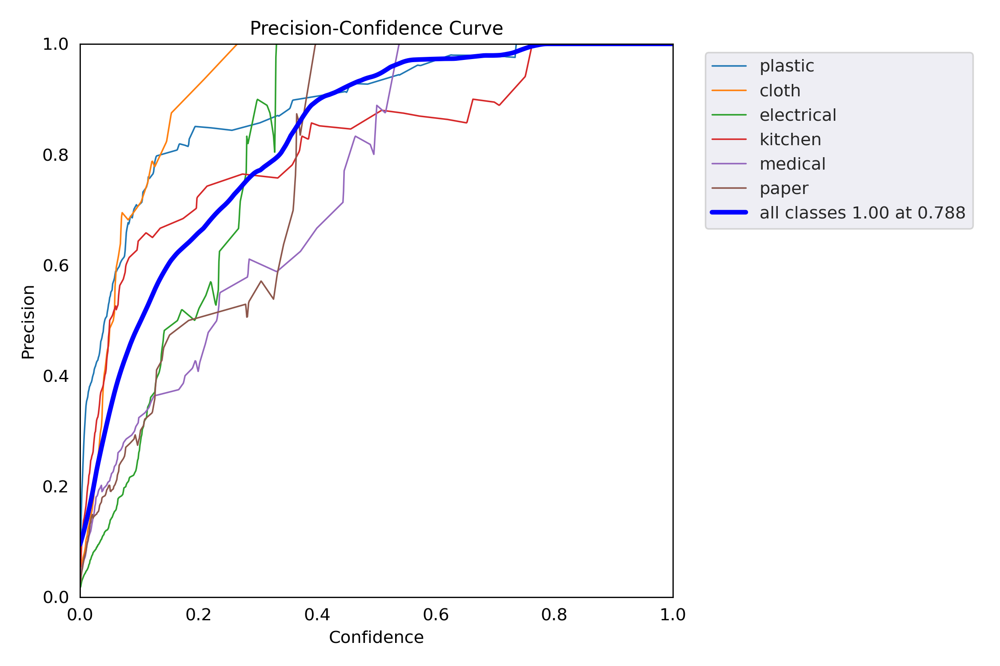

In [ ]:
Image(filename='/content/yolov5/runs/train/yolov5s_results/P_curve.png', width=900)

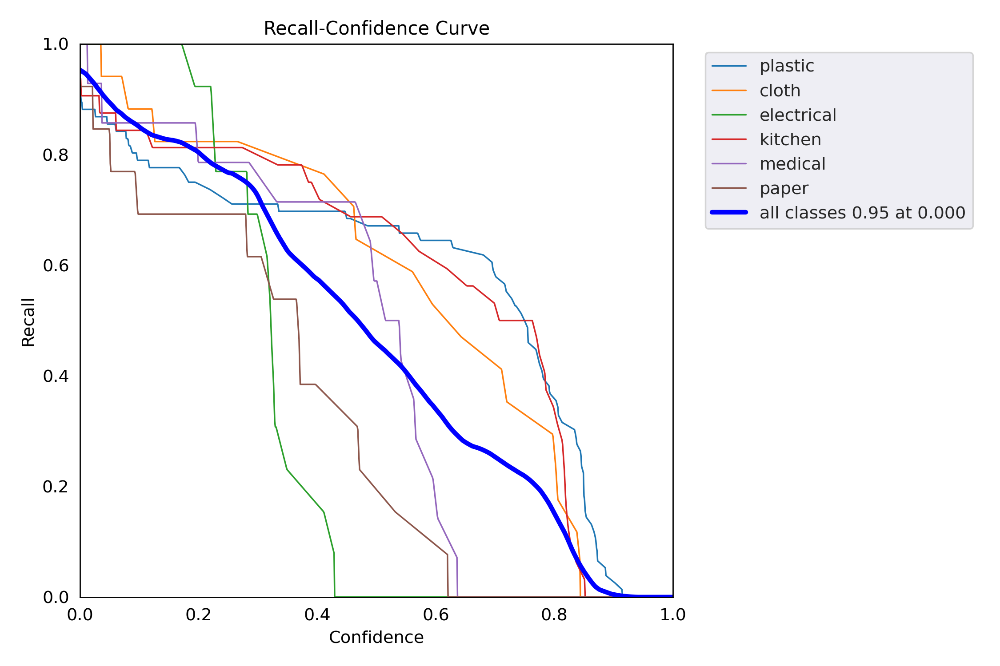

In [ ]:
Image(filename='/content/yolov5/runs/train/yolov5s_results/R_curve.png', width=900)

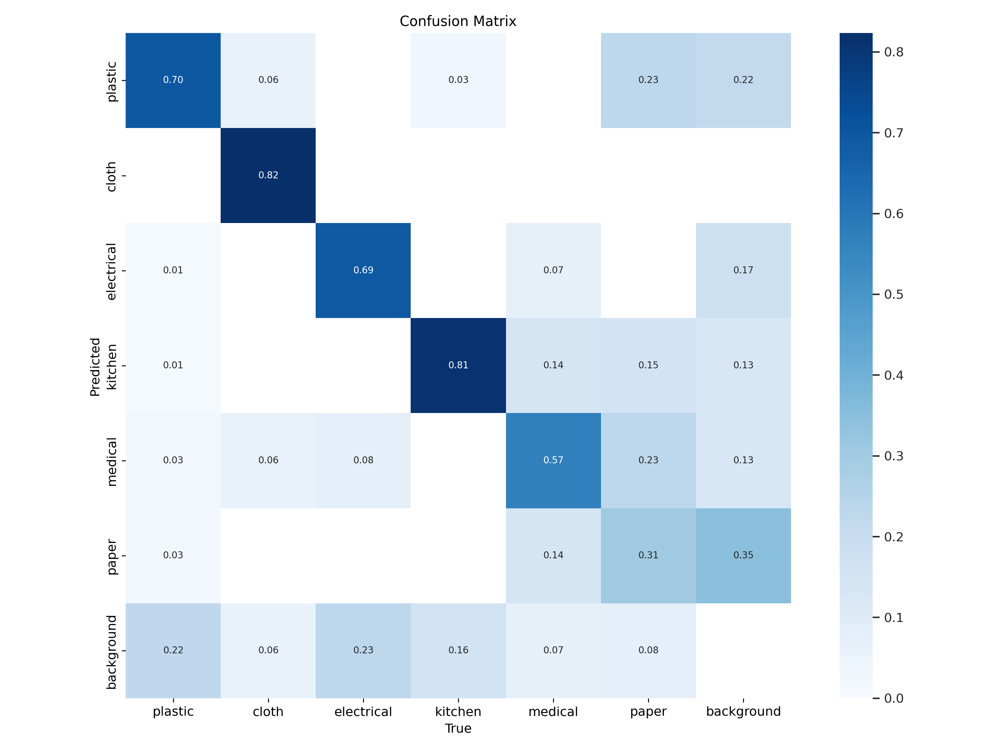

In [ ]:
Image(filename='/content/yolov5/runs/train/yolov5s_results/confusion_matrix.png', width=900)

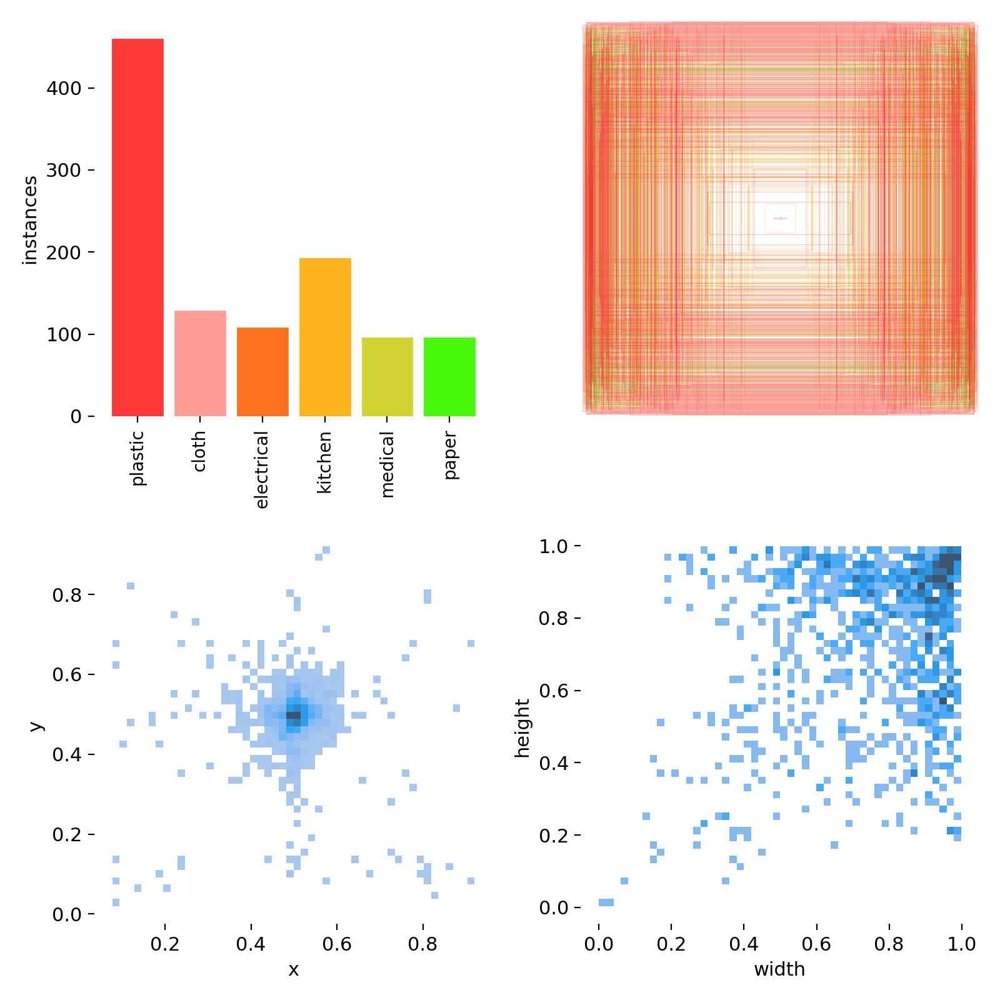

In [ ]:
Image(filename='/content/yolov5/runs/train/yolov5s_results/labels.jpg', width=900)

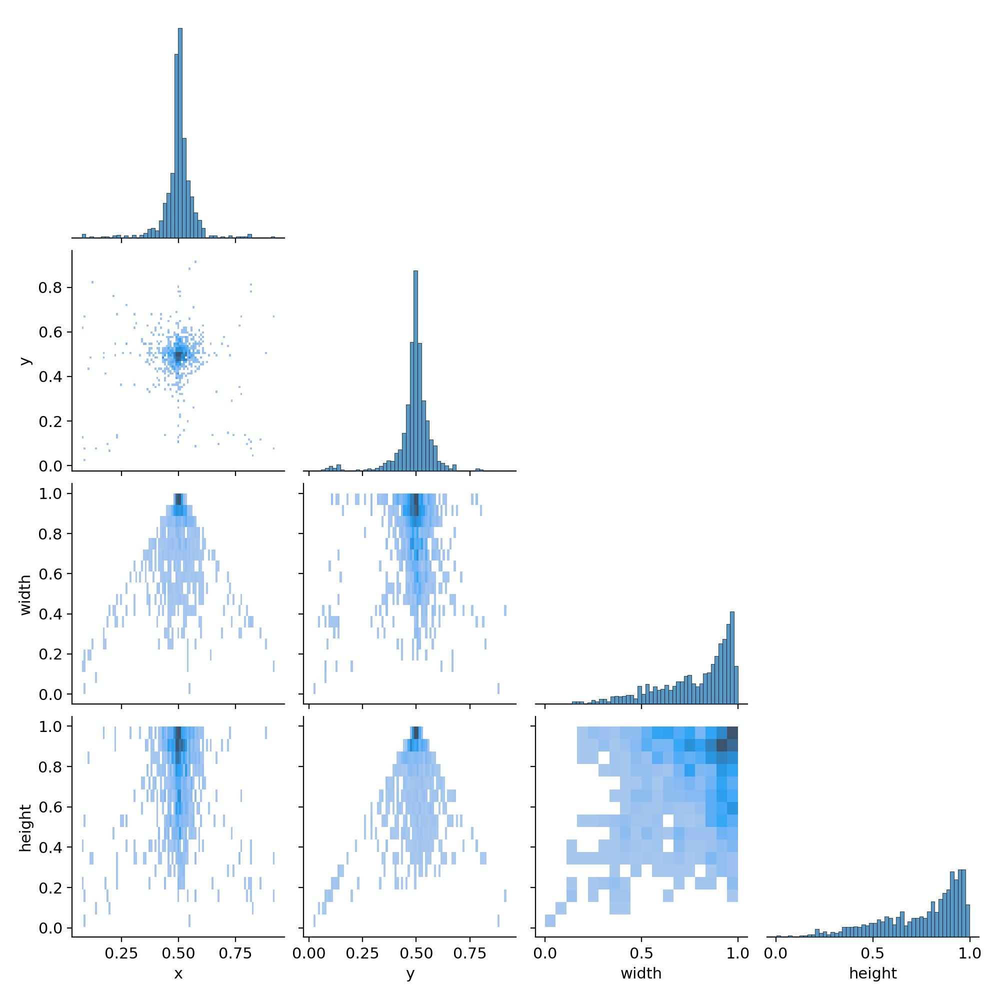

In [ ]:
Image(filename='/content/yolov5/runs/train/yolov5s_results/labels_correlogram.jpg', width=900)

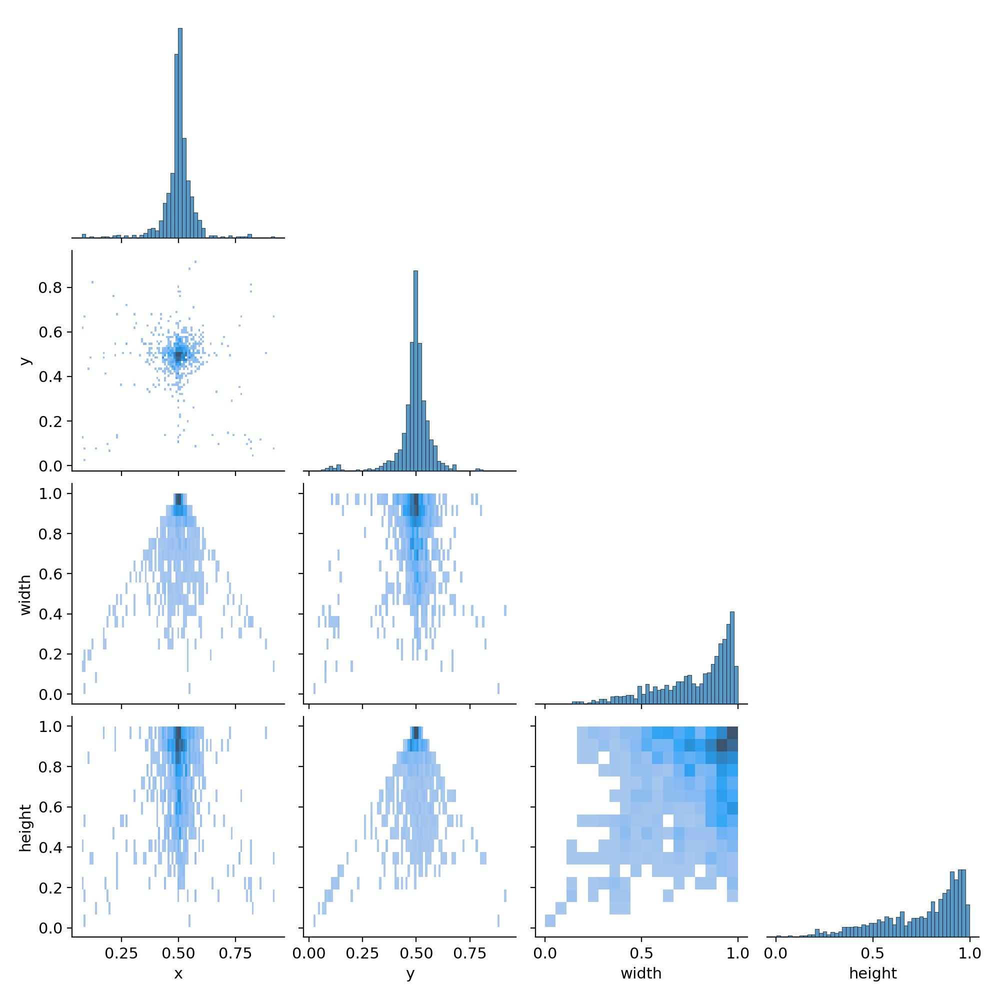

In [ ]:
Image(filename='/content/yolov5/runs/train/yolov5s_results/labels_correlogram.jpg', width=900)

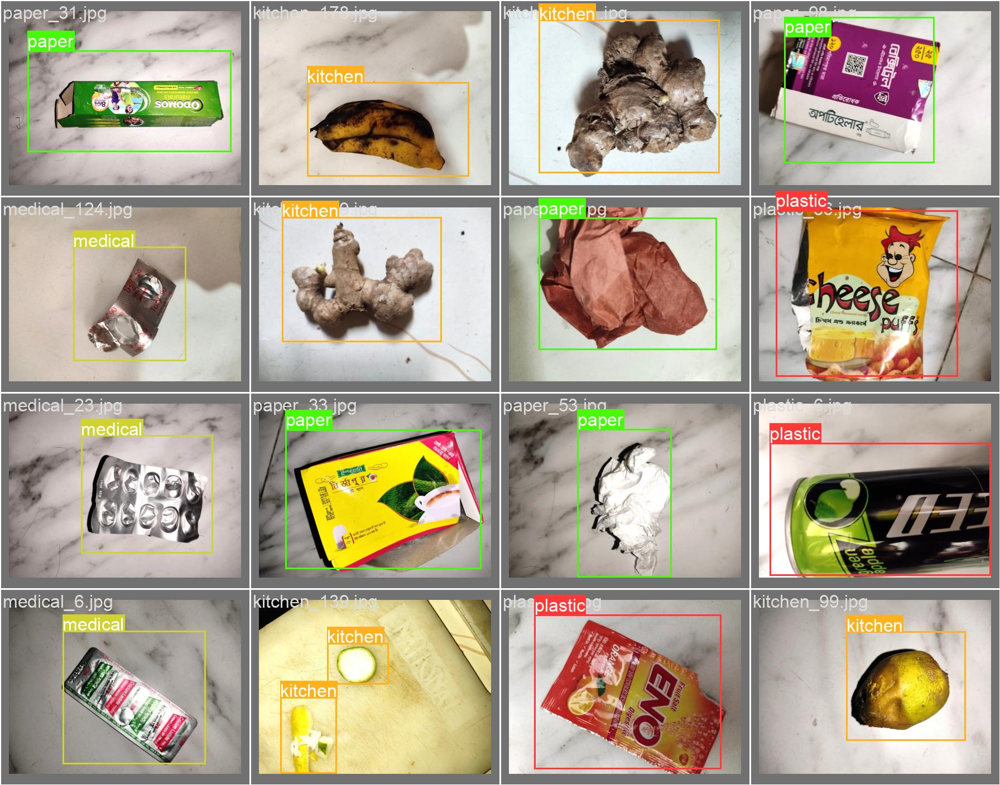

In [ ]:
Image(filename='/content/yolov5/runs/train/yolov5s_results/val_batch0_labels.jpg', width=900)

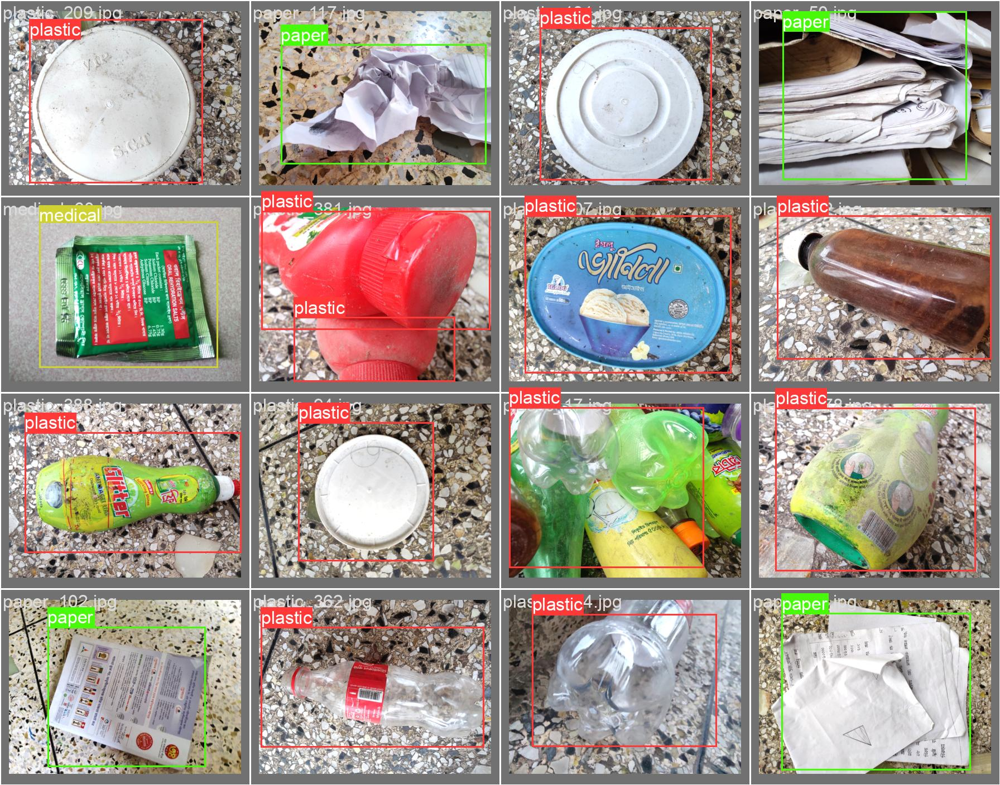

In [ ]:
Image(filename='/content/yolov5/runs/train/yolov5s_results/val_batch1_labels.jpg', width=900)

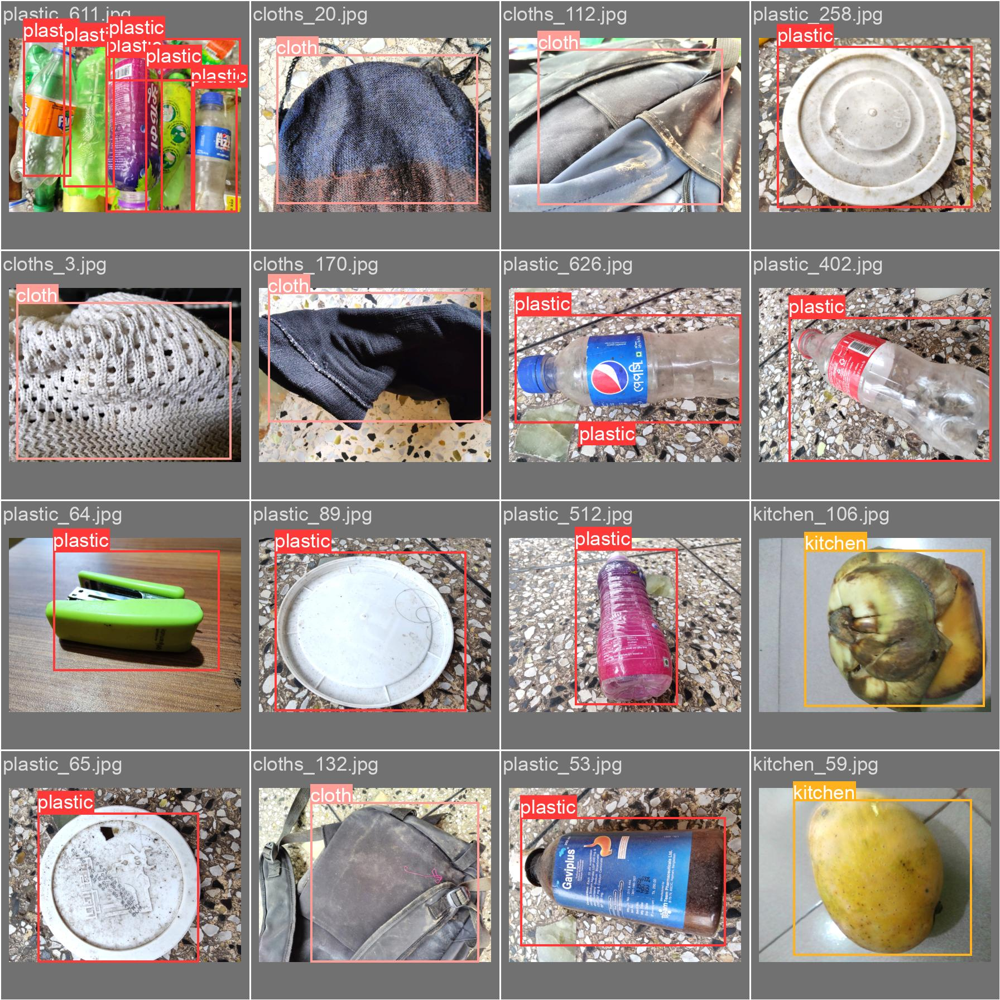

In [ ]:
Image(filename='/content/yolov5/runs/train/yolov5s_results/val_batch2_labels.jpg', width=900)

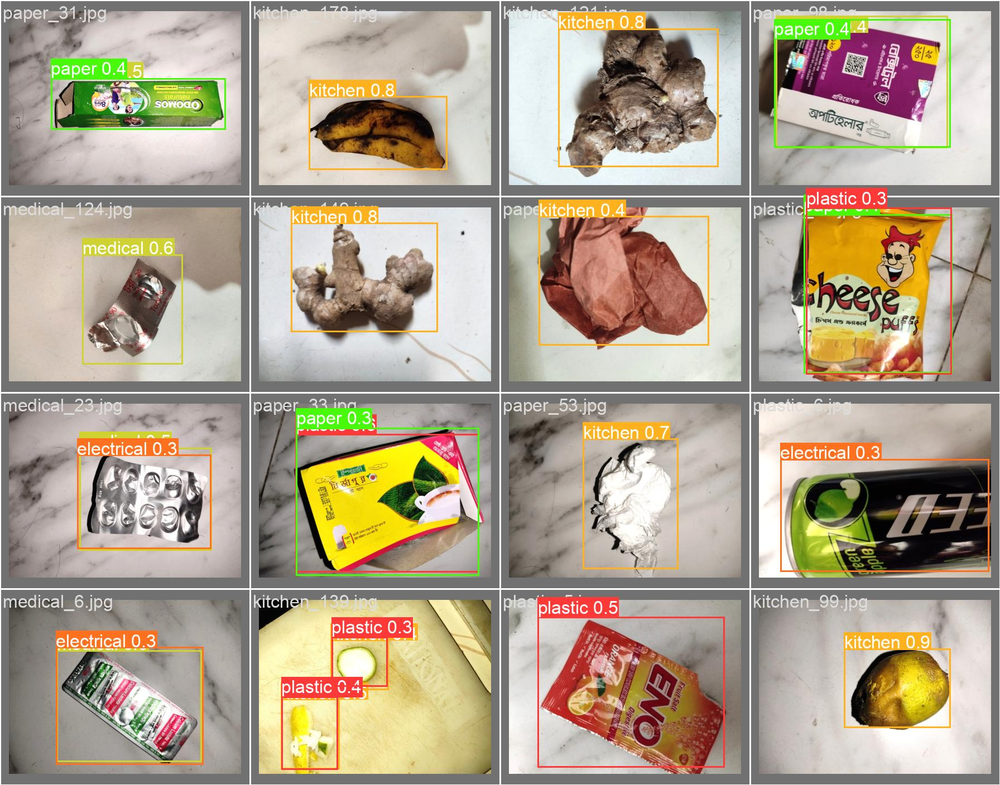

In [ ]:
Image(filename='/content/yolov5/runs/train/yolov5s_results/val_batch0_pred.jpg', width=900)

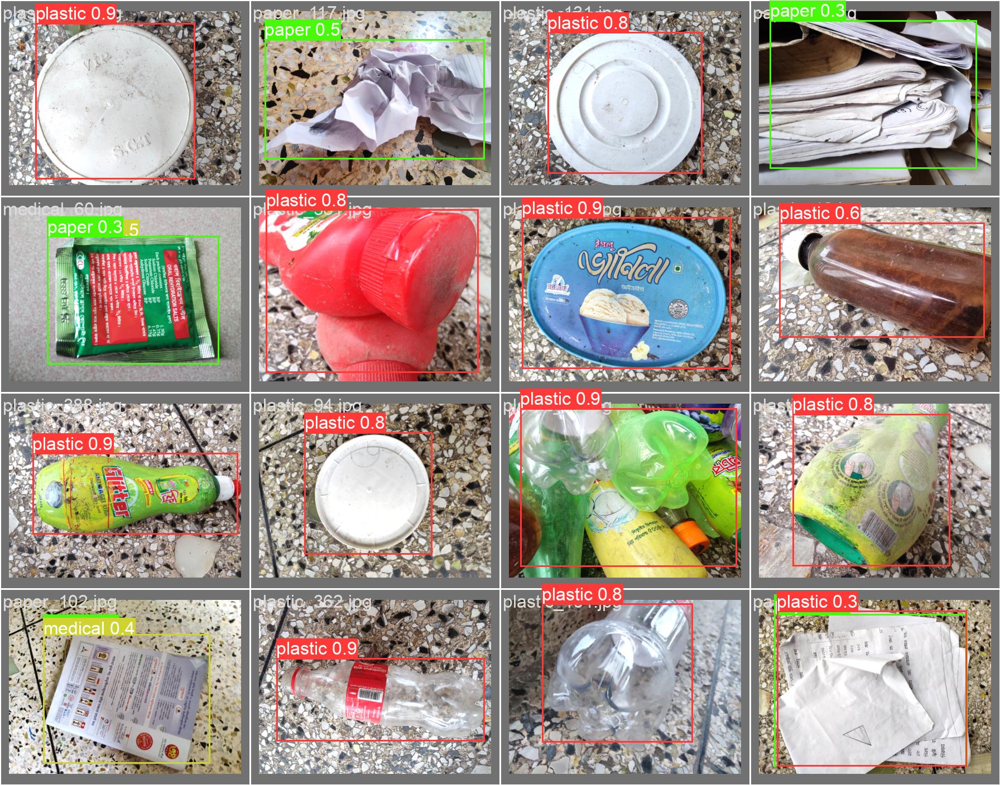

In [ ]:
Image(filename='/content/yolov5/runs/train/yolov5s_results/val_batch1_pred.jpg', width=900)

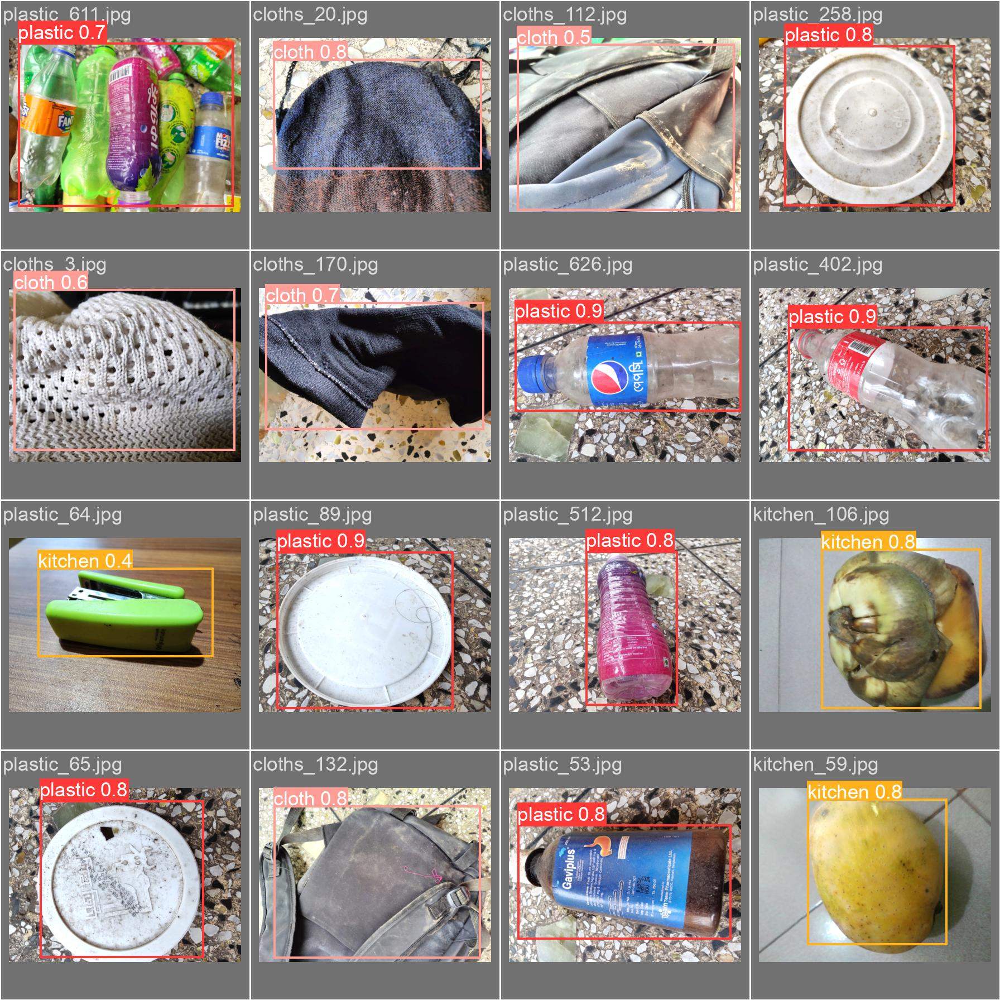

In [ ]:
Image(filename='/content/yolov5/runs/train/yolov5s_results/val_batch2_pred.jpg', width=900)

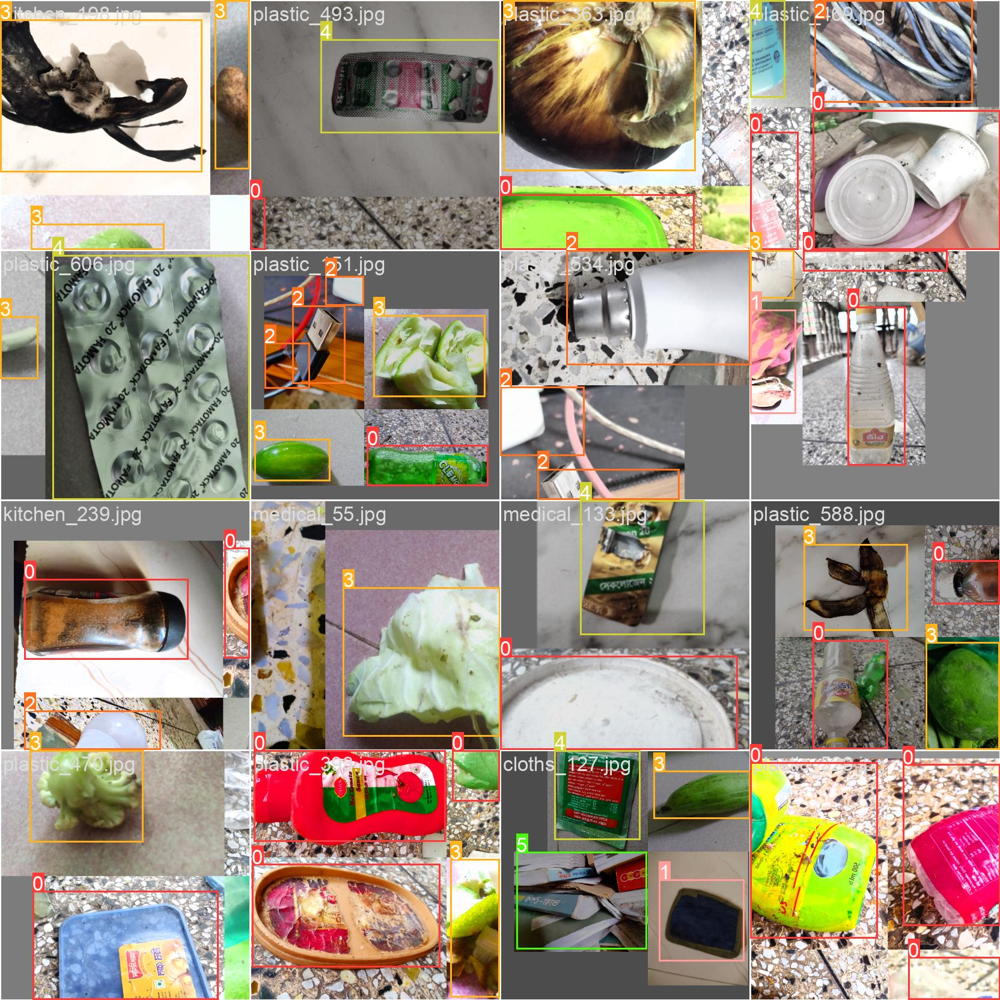

In [ ]:
Image(filename='/content/yolov5/runs/train/yolov5s_results/train_batch0.jpg', width=900)

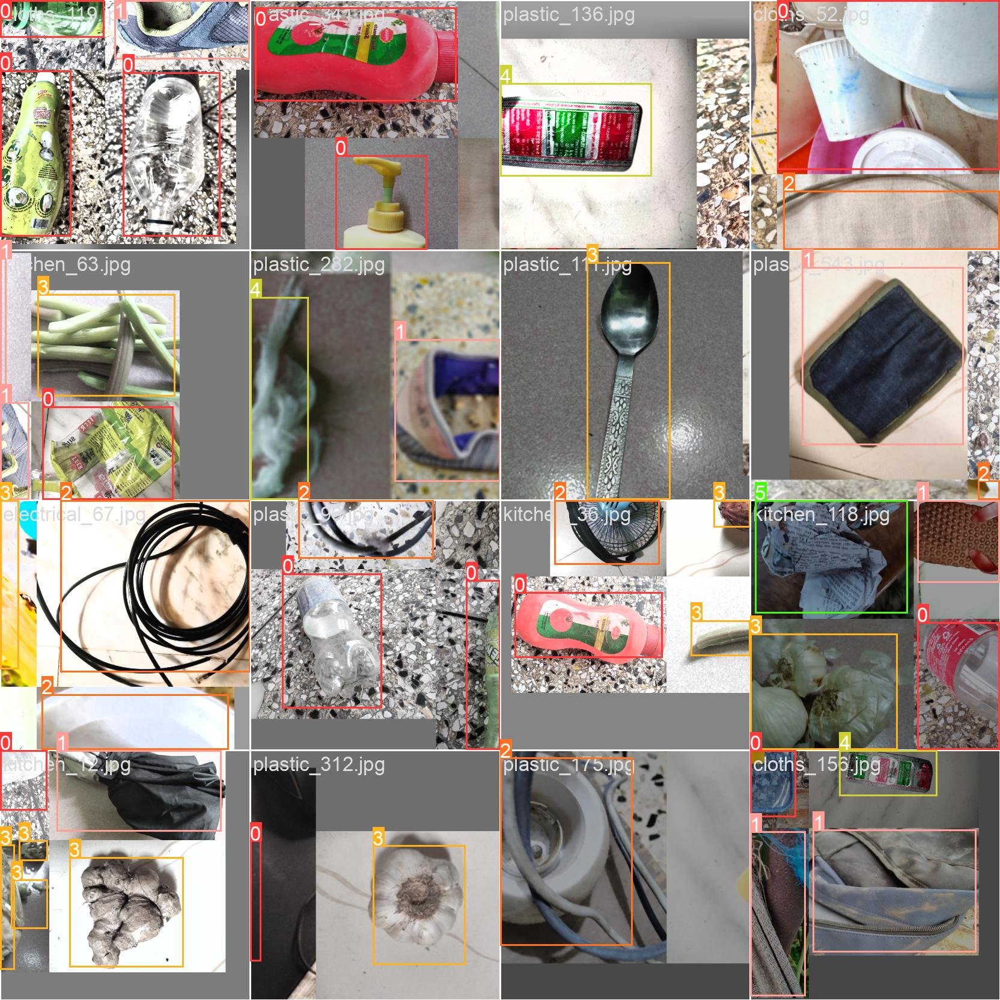

In [ ]:
Image(filename='/content/yolov5/runs/train/yolov5s_results/train_batch1.jpg', width=900)

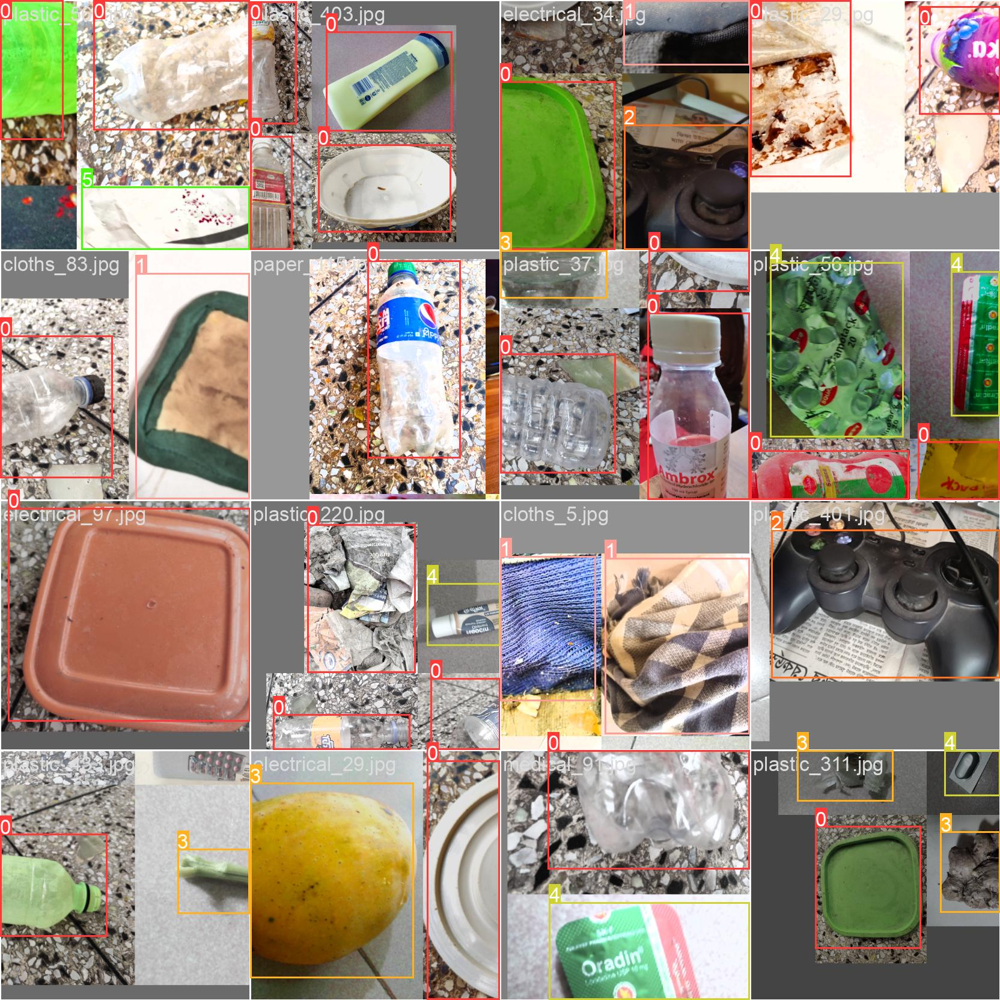

In [ ]:
Image(filename='/content/yolov5/runs/train/yolov5s_results/train_batch2.jpg', width=900)

In [ ]:
%ls runs/train/yolov5s_results/weights

best.pt  last.pt


In [ ]:
%cd /content/yolov5/
!python detect.py --weights runs/train/yolov5s_results/weights/best.pt --img 416 --conf 0.1 --source '/content/drive/MyDrive/garbage/data/test'

/content/yolov5
detect: weights=['runs/train/yolov5s_results/weights/best.pt'], source=/content/drive/MyDrive/garbage/data/test, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-232-g1c60c53 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7026307 parameters, 0 gradients, 15.8 GFLOPs
image 1/287 /content/drive/MyDrive/garbage/data/test/cloths_101.jpg: 320x416 1 cloth, 67.6ms
image 2/287 /content/drive/MyDrive/garbage/data/test/cloths_110.jpg: 416x320 1 cloth, 45.3ms
image 3/287 /content/drive/MyDrive/garbage/data/test/cloths_121.jpg: 416x320 1 cloth, 6.3ms
imag

In [ ]:
Image(filename='/content/yolov5/runs/detect/exp2/cloths_101.jpg', width=900)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
Image(filename='/content/yolov5/runs/detect/exp2/cloths_110.jpg', width=900)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
Image(filename='/content/yolov5/runs/detect/exp2/kitchen_151.jpg', width=900)

Output hidden; open in https://colab.research.google.com to view.

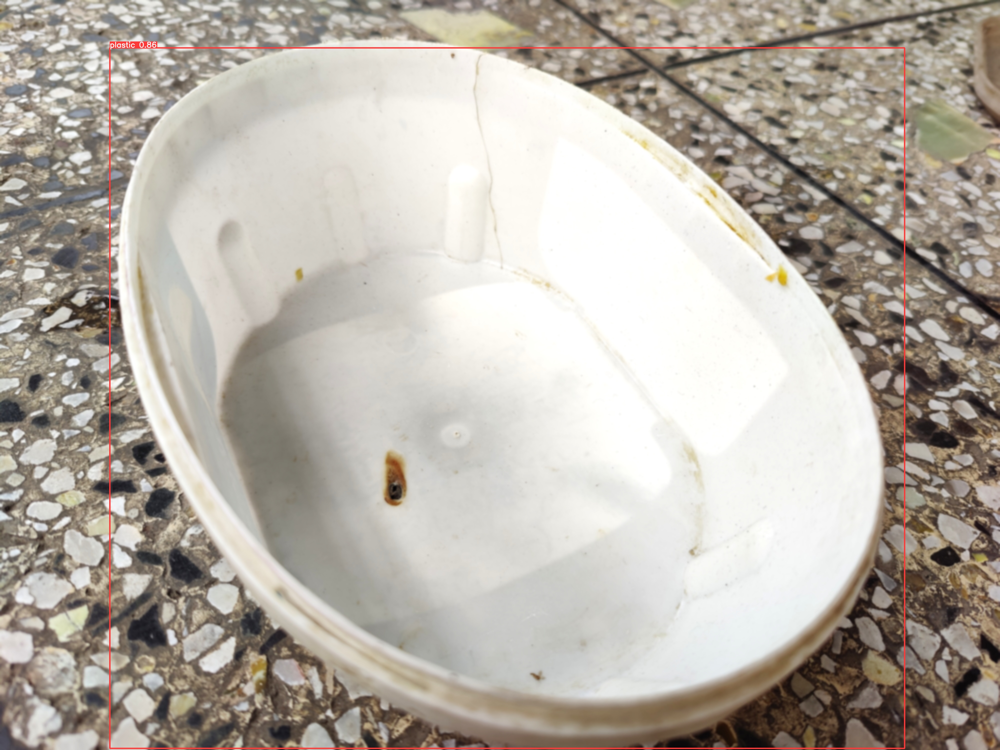

In [ ]:
Image(filename='/content/yolov5/runs/detect/exp2/plastic_91.jpg', width=900)

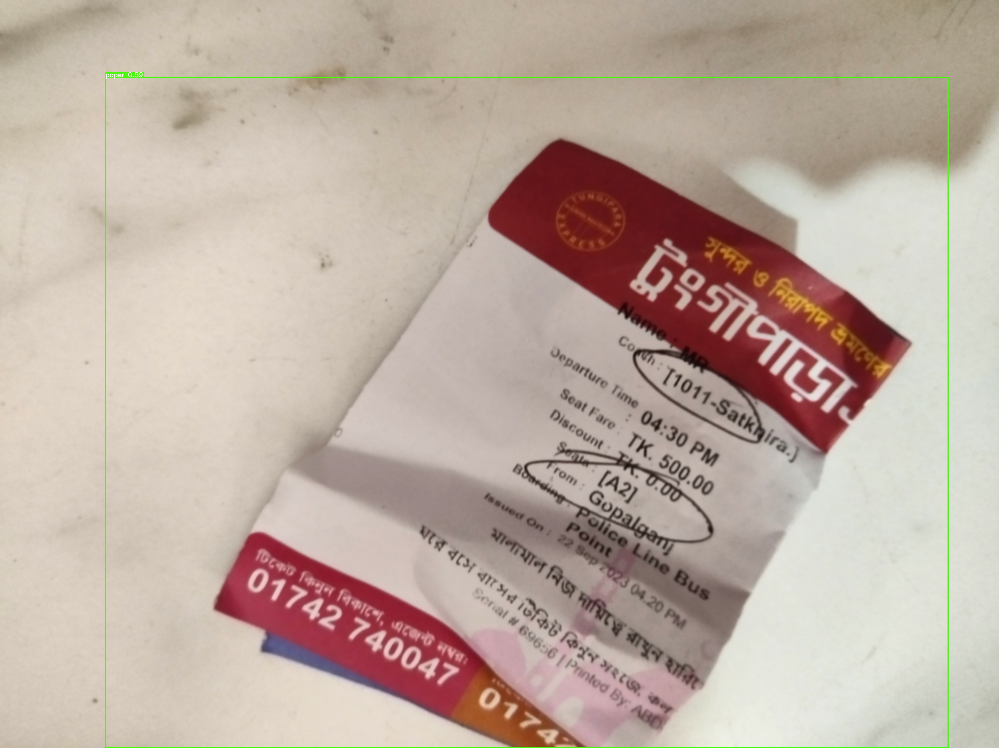

In [ ]:
Image(filename='/content/yolov5/runs/detect/exp2/paper_4.jpg', width=900)

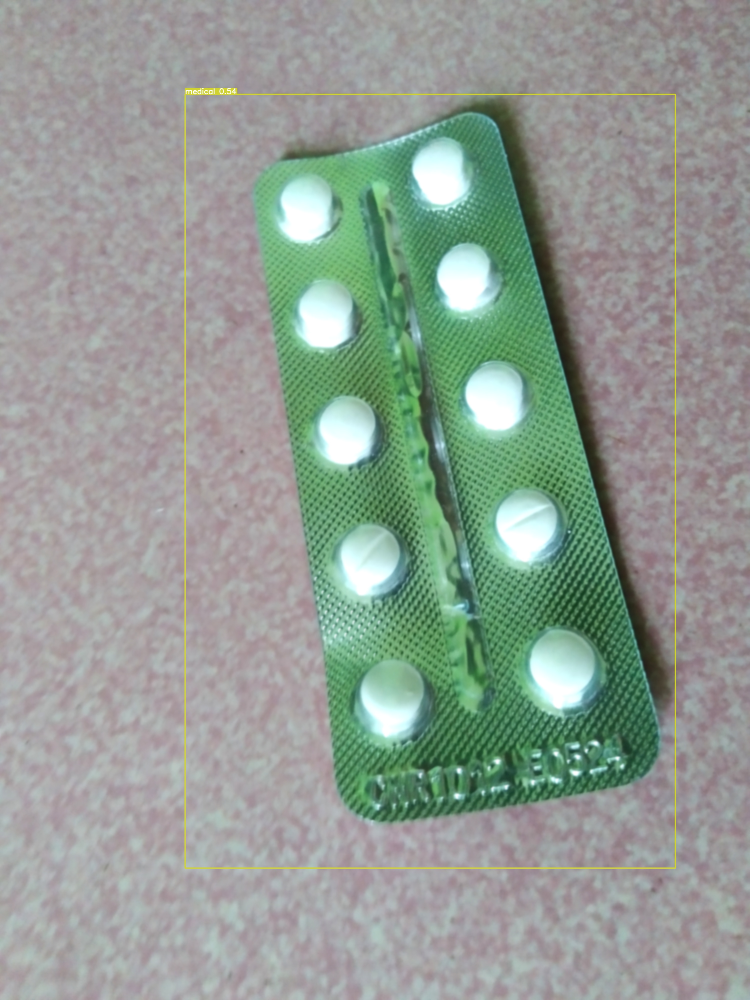

In [ ]:
Image(filename='/content/yolov5/runs/detect/exp2/medical_82.jpg', width=800)

In [ ]:
!cp -r /content/yolov5/runs /content/drive/MyDrive/garbage
